In [52]:
import geopandas as gpd
from osgeo import gdal
import xarray as xr
import rioxarray as rxr
from rasterio.enums import Resampling
import matplotlib.pyplot as plt
import hvplot
import hvplot.xarray
import hvplot.pandas

In [15]:
fire_perimeters_2020 = gpd.read_file("/data/nrietz/feature_layers/fire_atlas/final_viirs2020.gpkg")
roi = gpd.read_file("/data/nrietz/feature_layers/roi.geojson")

# Intersect
fire_within_roi = gpd.overlay(fire_perimeters_2020, roi, how='intersection')
fire_within_roi.head()

,fireid,mergid,n_pixels,farea,fperim,duration,tst_year,tst_month,tst_day,tst_ampm,...,ted_ampm,lcc_final,OBJECTID,OBJECTID_1,FID,site,label,Shape_Length,Shape_Area,geometry
0,17548,17548,4833,747.396877,298.403915,28.5,2020,7,10,PM,...,PM,grassland,1,8,2,West,West,5.778187,1.495687,"MULTIPOLYGON (((145.91004 71.35729, 145.90997 ..."
1,19526,19526,4,0.445378,2760.353404,1.5,2020,8,4,PM,...,PM,graminoid tundra,1,8,2,West,West,5.778187,1.495687,"POLYGON ((146.15876 71.28985, 146.15876 71.289..."
2,18550,18550,3,0.293622,2.295022,0.5,2020,7,21,PM,...,PM,graminoid tundra,1,8,2,West,West,5.778187,1.495687,"POLYGON ((144.79716 71.38749, 144.79665 71.387..."
3,17553,17553,123,16.837889,26.079868,4.5,2020,7,10,PM,...,PM,grassland,1,8,2,West,West,5.778187,1.495687,"POLYGON ((145.89552 71.35226, 145.89504 71.352..."
4,17621,17621,75,9.136936,16.315233,3.5,2020,7,11,PM,...,PM,grassland,1,8,2,West,West,5.778187,1.495687,"POLYGON ((144.83834 71.36056, 144.83814 71.360..."


In [22]:
fire_within_roi.explore("tst_day", legend=True, alpha = 0.5)

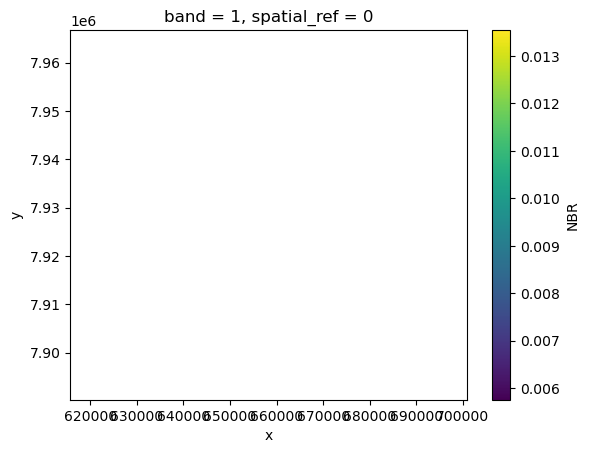

In [68]:
nbr_pre = rxr.open_rasterio("/data/nrietz/raster/hls/HLS.S30.T54WXE.2019256T022551.v2.0_NBR_cropped.tif")
nbr_pre.plot()

In [63]:
dnbr.x

<xarray.DataArray 'x' (x: 3417)> Size: 27kB
array([404690., 404710., 404730., ..., 472970., 472990., 473010.])
Coordinates:
  * x            (x) float64 27kB 4.047e+05 4.047e+05 ... 4.73e+05 4.73e+05
    spatial_ref  int64 8B 0
Attributes:
    axis:           X
    long_name:      x coordinate of projection
    standard_name:  projection_x_coordinate
    units:          metre

In [59]:
# assign CRS and resample to 30 m HLS resolution
dnbr = dnbr.rio.reproject("EPSG:32655",
                          resolution = (30, 30),
                          resampling=Resampling.bilinear)


In [60]:
dnbr.hvplot.image(cmap='inferno',
                  frame_width= 800,
                  fontscale=1.6,
                  crs='EPSG:32655',
                  tiles='ESRI').opts(title='Sentinel-2 dNBR (M. Hodel)')

:DynamicMap   [band]
   :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .Image.I :Image   [x,y]   (b1)

In [71]:
from ../hls_dld_test import *

SyntaxError: invalid syntax (1265505502.py, line 1)

In [70]:
import os
os.getcwd()

'/home/nrietz/TundraPreFire/code/exploratory'

In [72]:
import sys
sys.path.append(os.path.abspath(os.path.join('..', 'data_download')))

In [78]:
import earthaccess
from hls_dld_test import load_rasters,calc_index, create_quality_mask, scaling

# GDAL configurations used to successfully access LP DAAC Cloud Assets via vsicurl
gdal.SetConfigOption('GDAL_HTTP_COOKIEFILE','~/cookies.txt')
gdal.SetConfigOption('GDAL_HTTP_COOKIEJAR', '~/cookies.txt')
gdal.SetConfigOption('GDAL_DISABLE_READDIR_ON_OPEN','EMPTY_DIR')
gdal.SetConfigOption('CPL_VSIL_CURL_ALLOWED_EXTENSIONS','TIF')
gdal.SetConfigOption('GDAL_HTTP_UNSAFESSL', 'YES')
gdal.SetConfigOption('GDAL_HTTP_MAX_RETRY', '10')
gdal.SetConfigOption('GDAL_HTTP_RETRY_DELAY', '0.5')

# Configure Earthaccess
auth = earthaccess.Auth()
auth.login(strategy = "netrc")
if auth.authenticated:
    print("Successfully authenticated Earthaccess.")
# %% User configurations

START_DATE = "2020-09-11T00:00:00"
END_DATE = "2020-09-12T23:59:59"

# nr. of maximum returned images
MAX_IMG = 100 

# define chunk size for data loading
chunk_size = dict(band=1, x=512, y=512)

# Load AOIs
aois = gpd.read_file("/data/nrietz/feature_layers/roi.geojson")
bbox = tuple(list(aois.total_bounds))
print("AOI loaded.")

# Define time window
temporal = (START_DATE, END_DATE)

Successfully authenticated Earthaccess.
AOI loaded.
Retrieving granules...
10 granules found.
Processing: HLS.S30.T55WDV.2020255T025549.
HLS.S30.T55WDV.2020255T025549.v2.0_NBR_cropped.tif has already been processed and is available in this directory, moving to next file.
Processed file 1 of 10
Processing: HLS.S30.T54WXE.2020255T025549.
HLS.S30.T54WXE.2020255T025549.v2.0_NBR_cropped.tif has already been processed and is available in this directory, moving to next file.
Processed file 2 of 10
Processing: HLS.L30.T55WDV.2020256T015532.


KeyboardInterrupt: 

In [79]:
results = earthaccess.search_data(
    short_name=['HLSL30','HLSS30'],
    bounding_box=bbox,
    temporal=temporal,
    count=MAX_IMG
)

# retrieve URLS
print("Retrieving granules...")
hls_results_urls = [granule.data_links() for granule in results]

print(f"{len(hls_results_urls)} granules found.")

browse_urls = [granule.dataviz_links()[0] for granule in results] # 0 retrieves only the https links

# define bits to mask out
"""
7-6 = aerosols
5 = water
4 = snow/ice
3 = cloud shadow
2 = cloud/shadow adjacent
1 = cloud
0 = cirrus
"""
bit_nums = [0,1,2,3,4,5,6,7]

NameError: name 'bbox' is not defined